In [43]:
import io
import pandas as pd
from IPython.display import Image
from google.cloud import vision
from PIL import Image as PILImage, ImageDraw, ImageFont

# Detecting landmarks using Vision

This notebooks shows how you can use the Google Cloud Vision API to detect common landmarks in photos.

We'll use the Google Cloud Client Library for Vision to perform landmark detection on some places I've been.

## Can it figure out what the space needle is?

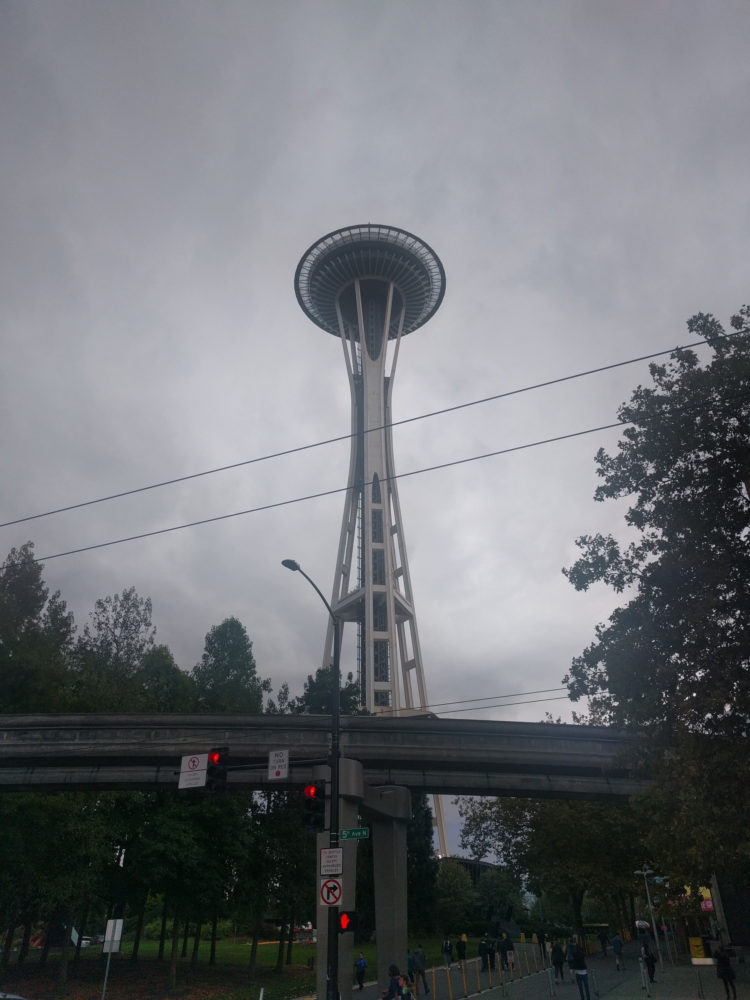

In [44]:
spaceneedle_picture = open('data/spaceneedle.jpg', 'rb').read()

# Display our picture
Image(spaceneedle_picture, width=800)

In [45]:
client = vision.ImageAnnotatorClient()

In [46]:
response = client.landmark_detection(image=vision.types.Image(content=spaceneedle_picture))
response

landmark_annotations {
  mid: "/m/01k7v7"
  description: "Space Needle"
  score: 0.40448877215385437
  bounding_poly {
    vertices {
      x: 1437
      y: 1872
    }
    vertices {
      x: 1663
      y: 1872
    }
    vertices {
      x: 1663
      y: 2713
    }
    vertices {
      x: 1437
      y: 2713
    }
  }
  locations {
    lat_lng {
      latitude: 47.62055405349613
      longitude: -122.349296
    }
  }
}

## Visualizing the data

Let's use jupyter & pillow to visualize this data.

In [2]:
def draw_landmarks(image_data, response):
    img = PILImage.open(io.BytesIO(image_data))
    draw = ImageDraw.Draw(img)
    font = ImageFont.truetype('data/roboto.ttf', 60)

    for landmark in response.landmark_annotations:
        box = [(vertex.x, vertex.y)
               for vertex in landmark.bounding_poly.vertices]
        draw.line(box + [box[0]], width=5, fill='#00ff00')
        top_left = (landmark.bounding_poly.vertices[0].x, landmark.bounding_poly.vertices[0].y - 60)
        draw.text(top_left, landmark.description, font=font, fill="#00ff00")

    img = img.resize((int(img.width/3), int(img.height/3)))

    return img

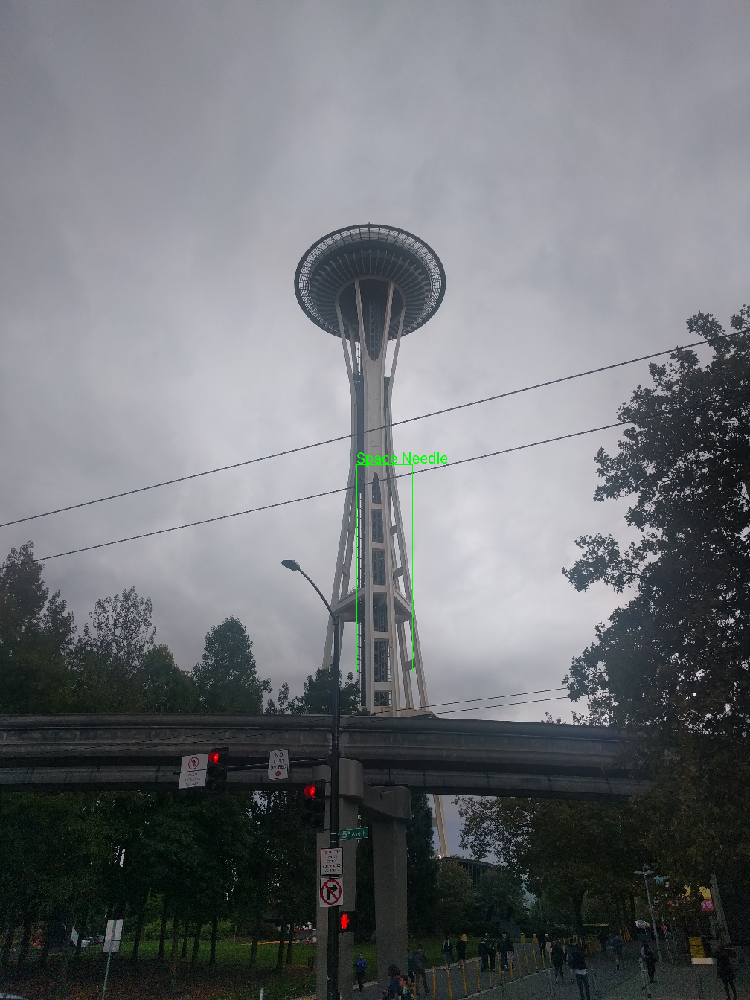

In [48]:
draw_landmarks(spaceneedle_picture, response)

In [49]:
import os
from urllib.parse import urlencode

def simple_map(lat, lng):
    params = {
        'key': os.environ.get('GOOGLE_API_KEY'),
        'size': '800x800',
        'center': f'{lat},{lng}',
        'zoom': 12,
        'markers': f'{lat},{lng}',
    }
    base_url = 'https://maps.googleapis.com/maps/api/staticmap'
    url = f"{base_url}?{urlencode(params)}"
    return Image(url=url, format='jpg')

In [50]:
location = response.landmark_annotations[0].locations[0].lat_lng
simple_map(location.latitude, location.longitude)

## How about the Oakland Bay Bridge?

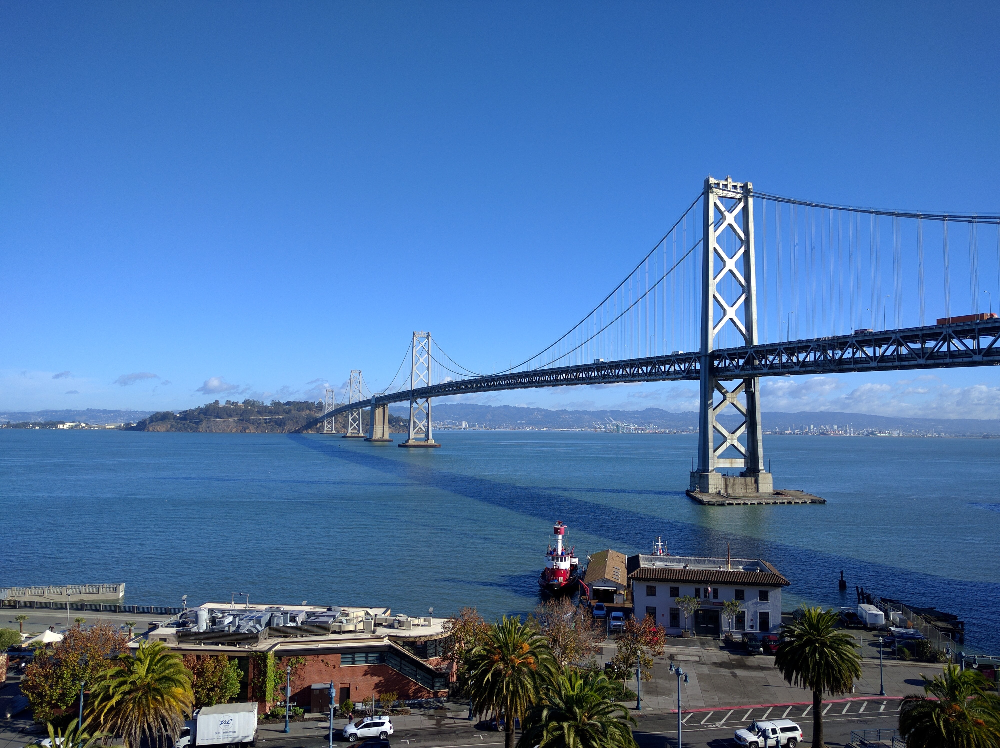

In [51]:
baybridge_picture = open('data/baybridge.jpg', 'rb').read()

# Display our picture
Image(baybridge_picture, width=800)

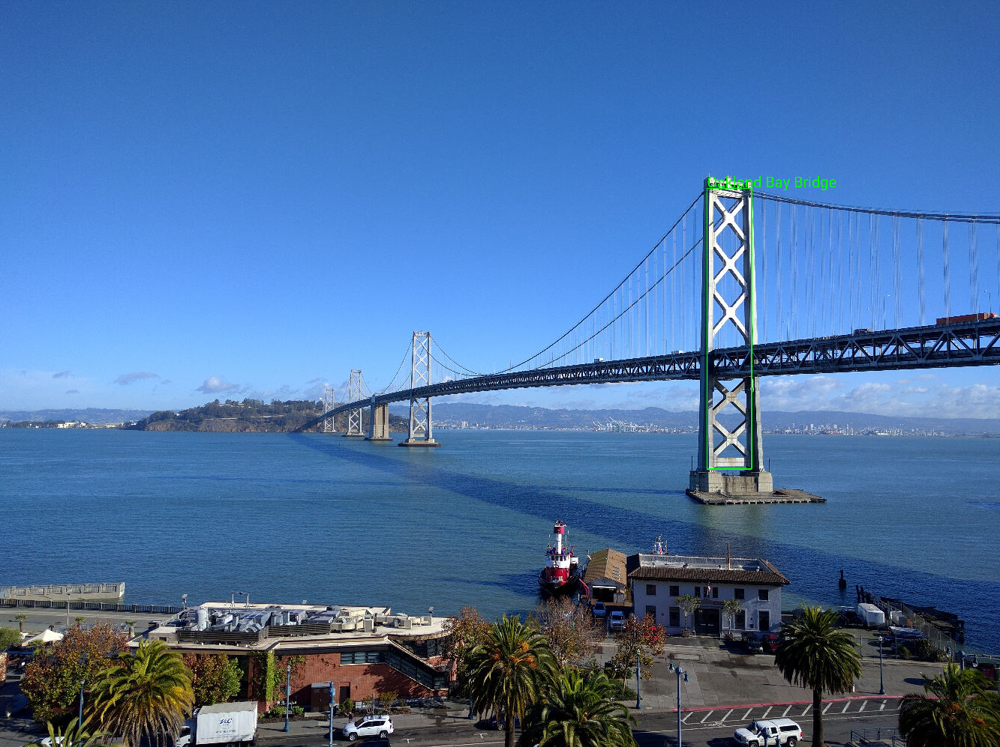

In [55]:
response = client.landmark_detection(image=vision.types.Image(content=baybridge_picture))
draw_landmarks(baybridge_picture, response)

In [57]:
location = response.landmark_annotations[0].locations[0].lat_lng
simple_map(location.latitude, location.longitude)